###**Corswara audio analysis**

###Importing required libraries

In [ ]:
import json
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras
import tensorflow as tf
#tf.compat.v1.enable_eager_execution()

###Downloading the data set from git hub

In [ ]:
!git clone https://github.com/iiscleap/Coswara-Data.git


Cloning into 'Coswara-Data'...
remote: Enumerating objects: 613, done.
remote: Total 613 (delta 0), reused 0 (delta 0), pack-reused 613
Receiving objects: 100% (613/613), 12.54 GiB | 41.37 MiB/s, done.
Resolving deltas: 100% (222/222), done.
Checking out files: 100% (158/158), done.


### Extracting the zipped files using extract.py file

In [ ]:
import os
import sys
import subprocess
import numpy as np
import glob
import json
import pandas as pd

'''
This script creates a folder "Extracted_data" inside which it extracts all the wav files in the directories date-wise
'''

coswara_data_dir = os.path.abspath("/content/Coswara-Data") # Local Path of iiscleap/Coswara-Data Repo
extracted_data_dir = os.path.join(coswara_data_dir, 'Extracted_data')  

if not os.path.exists(coswara_data_dir):
    raise("Check the Coswara dataset directory!")

if not os.path.exists(extracted_data_dir):
    os.makedirs(extracted_data_dir) # Creates the Extracted_data folder if it doesn't exist

dirs_extracted = set(map(os.path.basename,glob.glob('{}/202*'.format(extracted_data_dir))))
dirs_all = set(map(os.path.basename,glob.glob('{}/202*'.format(coswara_data_dir))))

dirs_to_extract = list(set(dirs_all) - dirs_extracted)

for d in dirs_to_extract:
    p = subprocess.Popen('cat {}/{}/*.tar.gz.* |tar -xvz -C {}/'.format(coswara_data_dir, d, extracted_data_dir), shell=True)
    p.wait()


print("Extraction process complete!")

Extraction process complete!


###Reading the csv file to analyse the data

In [ ]:
metadata_file = pd.read_csv("/content/Coswara-Data/combined_data.csv")

In [ ]:
metadata_file.head()

,id,a,covid_status,ep,g,l_c,l_l,l_s,rU,smoker,cold,ht,diabetes,fever,asthma,um,cough,ihd,bd,st,ftg,mp,loss_of_smell,cld,test_status,diarrhoea,pneumonia,ctScan,testType,test_date,vacc,ctDate,ctScore,others_resp,others_preexist
0,iV3Db6t1T8b7c5HQY2TwxIhjbzD3,28,healthy,y,male,India,Anantapur,Andhra Pradesh,n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AxuYWBN0jFVLINCBqIW5aZmGCdu1,25,healthy,y,male,India,BENGALURU URBAN,Karnataka,n,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,C5eIsssb9GSkaAgIfsHMHeR6fSh1,28,healthy,y,female,United States,Pittsburgh,Pennsylvania,n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,YjbEAECMBIaZKyfqOvWy5DDImUb2,26,healthy,y,male,India,Bangalore,Karnataka,n,NaN,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,aGOvk4ji0cVqIzCs1jHnzlw2UEy2,32,healthy,y,male,India,Nalanda,Bihar,n,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Displaying the information of the each column,nullvalues,numer of rows,Datatype

In [ ]:
metadata_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1895 entries, 0 to 1894
Data columns (total 35 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               1895 non-null   object 
 1   a                1895 non-null   int64  
 2   covid_status     1895 non-null   object 
 3   ep               1895 non-null   object 
 4   g                1895 non-null   object 
 5   l_c              1895 non-null   object 
 6   l_l              1666 non-null   object 
 7   l_s              1895 non-null   object 
 8   rU               1215 non-null   object 
 9   smoker           235 non-null    object 
 10  cold             142 non-null    object 
 11  ht               125 non-null    object 
 12  diabetes         111 non-null    object 
 13  fever            127 non-null    object 
 14  asthma           73 non-null     object 
 15  um               857 non-null    object 
 16  cough            216 non-null    object 
 17  ihd           

### unique_values in the data for each column

In [ ]:
metadata_file.nunique()

id                 1895
a                    77
covid_status          7
ep                    2
g                     3
l_c                  47
l_l                 647
l_s                 140
rU                    2
smoker                4
cold                  1
ht                    1
diabetes              1
fever                 1
asthma                1
um                    2
cough                 1
ihd                   1
bd                    1
st                    1
ftg                   1
mp                    1
loss_of_smell         1
cld                   1
test_status           3
diarrhoea             1
pneumonia             1
ctScan                2
testType              2
test_date            38
vacc                  3
ctDate                8
ctScore               6
others_resp           1
others_preexist       1
dtype: int64

###Count of males,female,other

In [ ]:
metadata_file.g.value_counts()

male      1387
female     507
other        1
Name: g, dtype: int64

###Covid status number of members for each category

In [ ]:
metadata_file.covid_status.value_counts()

healthy                        1337
positive_mild                   178
no_resp_illness_exposed         154
resp_illness_not_identified      90
recovered_full                   64
positive_moderate                40
positive_asymp                   32
Name: covid_status, dtype: int64

### smokers are present or not

In [ ]:
metadata_file.smoker.value_counts()

True     123
n        105
y          6
False      1
Name: smoker, dtype: int64

### For cold column  only true values are present in data set

In [ ]:
metadata_file.cold.value_counts()

True    142
Name: cold, dtype: int64

### For fever column true values are present

In [ ]:
metadata_file.fever.value_counts()

True    127
Name: fever, dtype: int64

###cough column is having only true values

In [ ]:
metadata_file.cough.value_counts()

True    216
Name: cough, dtype: int64

### one the json file data of a patient

In [ ]:
json_file = pd.read_json("/content/Coswara-Data/Extracted_data/20200504/1fMS9159tNOgEbgTXBoUpBXQUIr1/metadata.json",typ="series")

In [ ]:
json_file

a                      50
covid_status      healthy
dT                    web
diabetes             True
ep                      y
fV                      2
g                    male
l_c                 India
l_l             Bangalore
l_s             Karnataka
rU                      n
smoker               True
dtype: object

###using librosa to read and convert the audio signals into data

In [ ]:

### Let's read a sample audio using librosa
import librosa
audio_file_path='/content/Coswara-Data/Extracted_data/20200415/03TmwzsdEBVEh35MRMbC9d0NnfI3/cough-heavy.wav'
librosa_audio_data,librosa_sample_rate=librosa.load(audio_file_path)

In [ ]:
print(librosa_audio_data) ### Data of the audio signal

[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 ... -2.5911657e-05
 -1.5382074e-04  0.0000000e+00]


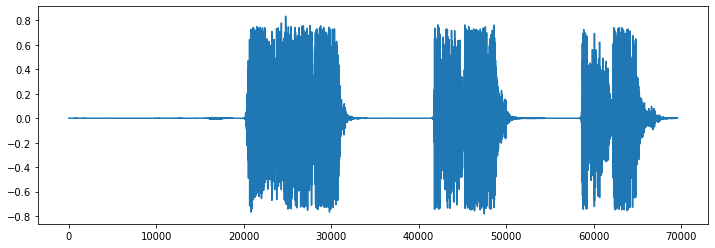

In [ ]:
### Lets plot the librosa audio data
import matplotlib.pyplot as plt
# Original audio with 1 channel 
plt.figure(figsize=(12, 4))
plt.plot(librosa_audio_data)

###mfcc data of the audio file

In [ ]:
mfccs = librosa.feature.mfcc(y=librosa_audio_data, sr=librosa_sample_rate, n_mfcc=40)
print(mfccs.shape)

(40, 136)


In [ ]:
mfccs

array([[-5.3354401e+02, -5.2180792e+02, -5.1701996e+02, ...,
        -4.5242209e+02, -4.8826672e+02, -5.0434351e+02],
       [ 2.9084802e+00,  1.8323503e+01,  2.4783012e+01, ...,
         8.7007599e+01,  5.4096680e+01,  3.5654770e+01],
       [ 2.4572542e+00,  1.4571598e+01,  2.0172222e+01, ...,
         2.5958305e+01,  2.4625925e+01,  1.5363647e+01],
       ...,
       [ 1.0172966e+00,  5.2588348e+00,  7.0178332e+00, ...,
        -4.1100378e+00, -3.7016268e+00, -4.8203793e+00],
       [ 1.1872659e+00,  3.7148075e+00,  5.5688763e+00, ...,
         1.0543917e+00, -1.8766651e+00, -4.0980129e+00],
       [ 1.2179909e+00,  1.7034168e+00,  3.5571575e+00, ...,
        -4.9321699e-01, -2.6586523e+00, -2.5966194e+00]], dtype=float32)

### Converting the folder data to classes,lables, mfccs and writing those into json file

In [ ]:
import json
import os
import math
import librosa

DATASET_PATH = "/content/Coswara-Data/Extracted_data/20200505/0HIgO2EhOOW1msCbEw1kC8Qsx6D3"
JSON_PATH = "data_10.json"
SAMPLE_RATE = 22050
TRACK_DURATION = 20 # measured in seconds
SAMPLES_PER_TRACK = SAMPLE_RATE * TRACK_DURATION
def save_mfcc(dataset_path, json_path, num_mfcc=13, n_fft=2048, hop_length=512, num_segments=5):
    #Extracts MFCCs from music dataset and saves them into a json file along witgh genre labels.

    # dictionary to store mapping, labels, and MFCCs
    data = {
        "mapping": [],
        "labels": [],
        "mfcc": []
    }


    # loop through all genre sub-folder
    samples_per_segment = int(SAMPLES_PER_TRACK / num_segments)
    num_mfcc_vectors_per_segment = math.ceil(samples_per_segment / hop_length)

    for i, (dirpath, dirnames, filenames) in enumerate(os.walk(dataset_path)):
          #print(dirpath)

        # ensure we're processing a genre sub-folder level
        #if dirpath is not dataset_path:
          for f in filenames:
            #print(f)
            if (f != "metadata.json"):
              semantic_label = f.split("/")[-1]
              semantic_label = semantic_label.split(".wav")[0]
              data["mapping"].append(semantic_label)
              print("\nProcessing: {}".format(semantic_label))
              
              file_path = os.path.join(dirpath, f)
              signal, sample_rate = librosa.load(file_path, sr=librosa.get_samplerate(file_path))

              
              if(len(signal)!=0):
                #print(file_path)
                for d in range(num_segments):
                  start = samples_per_segment * d
                  finish = start + samples_per_segment
                  # extract mfcc
                  mfcc = librosa.feature.mfcc(signal, librosa.get_samplerate(file_path), n_mfcc=num_mfcc, n_fft=n_fft, hop_length=hop_length)
                  mfcc = mfcc.T
                  data["mfcc"].append(mfcc.tolist())
                  data["labels"].append(d)
                  print("{}, segment:{}".format(file_path,d))
                    
   # save MFCCs to json file
    with open(json_path, "w") as fp:
        json.dump(data, fp, indent=4)
if __name__ == "__main__":
    save_mfcc(DATASET_PATH, JSON_PATH, num_segments=9)


Processing: vowel-a
/content/Coswara-Data/Extracted_data/20200505/0HIgO2EhOOW1msCbEw1kC8Qsx6D3/vowel-a.wav, segment:0
/content/Coswara-Data/Extracted_data/20200505/0HIgO2EhOOW1msCbEw1kC8Qsx6D3/vowel-a.wav, segment:1
/content/Coswara-Data/Extracted_data/20200505/0HIgO2EhOOW1msCbEw1kC8Qsx6D3/vowel-a.wav, segment:2
/content/Coswara-Data/Extracted_data/20200505/0HIgO2EhOOW1msCbEw1kC8Qsx6D3/vowel-a.wav, segment:3
/content/Coswara-Data/Extracted_data/20200505/0HIgO2EhOOW1msCbEw1kC8Qsx6D3/vowel-a.wav, segment:4
/content/Coswara-Data/Extracted_data/20200505/0HIgO2EhOOW1msCbEw1kC8Qsx6D3/vowel-a.wav, segment:5
/content/Coswara-Data/Extracted_data/20200505/0HIgO2EhOOW1msCbEw1kC8Qsx6D3/vowel-a.wav, segment:6
/content/Coswara-Data/Extracted_data/20200505/0HIgO2EhOOW1msCbEw1kC8Qsx6D3/vowel-a.wav, segment:7
/content/Coswara-Data/Extracted_data/20200505/0HIgO2EhOOW1msCbEw1kC8Qsx6D3/vowel-a.wav, segment:8

Processing: breathing-deep
/content/Coswara-Data/Extracted_data/20200505/0HIgO2EhOOW1msCbEw1kC8Q

### reading the downloaded json file to train the model according to labels

In [ ]:
DATA_PATH = "/content/data_10.json"

def load_data(data_path):
    """Loads training dataset from json file.
        :param data_path (str): Path to json file containing data
        :return X (ndarray): Inputs
        :return y (ndarray): Targets
    """

    with open(data_path, "r") as fp:
        data = json.load(fp)
        print(len(data["mfcc"]))

    # convert lists to numpy arrays
    
    X =np.array(data["mfcc"])
    y = np.array(data["labels"])
    #X =tf.convert_to_tensor(X,dtype=object
    #X=list(flatten(X))
    print("Data succesfully loaded!")

    return  X, y
load_data(DATA_PATH)


81
Data succesfully loaded!


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  app.launch_new_instance()


(array([list([[-566.818115234375, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [-530.6547241210938, 28.774085998535156, -15.254722595214844, -37.03204345703125, -18.946613311767578, 14.043763160705566, 24.813251495361328, 4.301697731018066, -22.71706771850586, -28.22491455078125, -10.169904708862305, 10.419525146484375, 15.585936546325684], [-448.8065490722656, 95.30712127685547, -27.60137939453125, -70.46751403808594, -22.114730834960938, 36.644683837890625, 30.300701141357422, -19.828073501586914, -42.27674102783203, -29.43529510498047, -8.927164077758789, 1.8809443712234497, -3.5988340377807617], [-420.07501220703125, 121.48365783691406, -22.847251892089844, -70.98728942871094, -18.87322998046875, 42.717411041259766, 34.298683166503906, -21.160350799560547, -42.76785659790039, -22.33002471923828, 0.616755485534668, 4.275521278381348, -8.425101280212402], [-438.3008117675781, 110.0655517578125, -13.065829277038574, -55.81774139404297, -12.216148376464844, 38.830989837

###Spliting the data into train and tet data,building the deep learning mode
1. input layer
2.3 Dense layers(hidden layers)
3.output layer

In [ ]:
if __name__ == "__main__":

    # load data
    lst=[]
    X, y = load_data(DATA_PATH)
    X=np.array(X).reshape(-1,1)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
    # build network topology
    model = keras.Sequential([

        # input layer
        keras.layers.Flatten(input_shape=(8,8)),

        # 1st dense layer
        keras.layers.Dense(512, activation='relu'),

        # 2nd dense layer
        keras.layers.Dense(256, activation='relu'),

        # 3rd dense layer
        keras.layers.Dense(64, activation='relu'),

        # output layer
        keras.layers.Dense(9, activation='softmax')
    ])


    

81
Data succesfully loaded!


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  app.launch_new_instance()


In [ ]:
X_train.shape

(64, 1)

###Compiling the data and summary of the data

In [ ]:
optimiser = keras.optimizers.Adam(learning_rate=0.0001)
model.compile(optimizer=optimiser,loss='sparse_categorical_crossentropy',metrics=['accuracy'])

model.summary()

Model: "sequential_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_25 (Flatten)         (None, 64)                0         
_________________________________________________________________
dense_100 (Dense)            (None, 512)               33280     
_________________________________________________________________
dense_101 (Dense)            (None, 256)               131328    
_________________________________________________________________
dense_102 (Dense)            (None, 64)                16448     
_________________________________________________________________
dense_103 (Dense)            (None, 9)                 585       
Total params: 181,641
Trainable params: 181,641
Non-trainable params: 0
_________________________________________________________________


### Converting labels to tensor data

In [ ]:
#X_train = tf.convert_to_tensor(X_train)
y_train = tf.convert_to_tensor(y_train)

In [ ]:
print(y_train.shape)

(64,)


#fitting the xtrain and ytrain modrl to find the accuracy of the model

In [ ]:
history = model.fit(X_train,y_train ,validation_data=(X_test,y_test) batch_size = 4,epochs=100)